In [1]:
# a=['id_sitio',
# 'corte_evento',
# 'Daily_Date',
# 'VolUnCorrected',
# 'VolCorrected',
# 'Pressure',
# 'Temperature',
# 'MaxPressure',
# 'MaxPressureTime',
# 'MinPressure',
# 'MinPressureTime',
# 'MaxFlow',
# 'maxFlowTime',
# 'MinFlow',
# 'MinFlowTime',
# 'MaxTemp',
# 'maxTempTime',
# 'MinTemp',
# 'MinTempTime',
# 'id_RTU']

In [2]:
import pandas as pd


In [3]:
def mytabla(data):
    nulls = pd.DataFrame(data.isnull().sum()/data.shape[0]*100, columns=['% de datos nulos'])
    ceros = pd.DataFrame((data==0).sum()/data.shape[0]*100, columns=['% de ceros'])
    tipo = pd.DataFrame(data.dtypes,columns=['Tipo de datos'])
    val = pd.DataFrame(data.nunique(),columns=['# de valores diferentes'])
    mis_val_table = pd.concat([nulls, ceros,tipo, val], axis=1)
    return mis_val_table

In [4]:
name = r"C:\Users\jibar\OneDrive - Universidad de los andes\Clases_Maestria\CIENCIA DE DATOS\Proyecto\General\General\Data\Daily.csv"

data =pd.read_csv(name,sep='|',error_bad_lines=False, warn_bad_lines= False,index_col=False,header=0, low_memory=False)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396887 entries, 0 to 396886
Data columns (total 20 columns):
id_sitio           396887 non-null int64
corte_evento       396887 non-null bool
Daily_Date         396887 non-null object
VolUnCorrected     396835 non-null object
VolCorrected       396818 non-null object
Pressure           396503 non-null object
Temperature        396503 non-null object
MaxPressure        9114 non-null float64
MaxPressureTime    9114 non-null object
MinPressure        9114 non-null float64
MinPressureTime    9114 non-null object
MaxFlow            9114 non-null float64
maxFlowTime        9114 non-null object
MinFlow            9114 non-null float64
MinFlowTime        9114 non-null object
MaxTemp            9114 non-null float64
maxTempTime        9114 non-null object
MinTemp            9114 non-null float64
MinTempTime        9114 non-null object
id_RTU             396625 non-null float64
dtypes: bool(1), float64(7), int64(1), object(11)
memory usage: 57.9+

In [6]:
data.head()


,id_sitio,corte_evento,Daily_Date,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MaxPressureTime,MinPressure,MinPressureTime,MaxFlow,maxFlowTime,MinFlow,MinFlowTime,MaxTemp,maxTempTime,MinTemp,MinTempTime,id_RTU
0,34,False,2013-08-19 23:59:59,"39,390000000000001","727,25",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,81.0
1,163,False,2013-08-21 23:59:59,"1434,9300000000001","24170,799999999999",NaN,NaN,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,3.0
2,40,False,2013-08-19 23:59:59,"7709,2600000000002","69097,570000000007",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,98.0
3,41,False,2013-08-19 23:59:59,"404,13999999999999","7004,7700000000004",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,89.0
4,50,False,2013-08-19 23:59:59,"3296,0100000000002","15331,190000000001",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,87.0


In [7]:
# mytabla(data)

In [8]:
data['MaxPressure'].value_counts()

0.0    9114
Name: MaxPressure, dtype: int64

In [9]:
def eliminar_coma(x):
    x=str(x).replace(',','.')
    return x

In [10]:

data['VolUnCorrected']=data['VolUnCorrected'].apply(eliminar_coma)
data['VolCorrected']=data['VolCorrected'].apply(eliminar_coma)
data['Pressure']=data['Pressure'].apply(eliminar_coma)
data['Temperature']=data['Temperature'].apply(eliminar_coma)


convert = {'id_sitio':'object',
          'VolUnCorrected':float,
          'VolCorrected':float,
          'Pressure':float,
          'Temperature':float,
          'MaxPressure':float,
          'MinPressure':float,
          'MaxFlow':float,
          'MinFlow':float,
          'MaxTemp':float,
          'MinTemp':float,
          'id_RTU':'object'}
data = data.astype(convert)

## desde este punto se puede entender mejor lo que hay en la BD

In [11]:
data.shape

(396887, 20)

In [12]:
data.dtypes

id_sitio            object
corte_evento          bool
Daily_Date          object
VolUnCorrected     float64
VolCorrected       float64
Pressure           float64
Temperature        float64
MaxPressure        float64
MaxPressureTime     object
MinPressure        float64
MinPressureTime     object
MaxFlow            float64
maxFlowTime         object
MinFlow            float64
MinFlowTime         object
MaxTemp            float64
maxTempTime         object
MinTemp            float64
MinTempTime         object
id_RTU              object
dtype: object

In [13]:
mytabla(data)

,% de datos nulos,% de ceros,Tipo de datos,# de valores diferentes
id_sitio,0.000000,0.000000,object,306
corte_evento,0.000000,100.000000,bool,1
Daily_Date,0.000000,0.000000,object,1907
VolUnCorrected,0.013102,5.477126,float64,114051
VolCorrected,0.017385,5.358452,float64,243108
Pressure,0.096753,1.574756,float64,21409
Temperature,0.096753,1.444492,float64,4189
MaxPressure,97.703628,2.296372,float64,1
MaxPressureTime,97.703628,0.000000,object,92
MinPressure,97.703628,2.296372,float64,1


In [14]:
numer = data.select_dtypes([float])
objeto= data.select_dtypes(['object'])

In [15]:
numer.describe()

,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MinPressure,MaxFlow,MinFlow,MaxTemp,MinTemp
count,3.968350e+05,3.968180e+05,396503.000000,396503.000000,9114.0,9114.0,9114.0,9114.0,9114.0,9114.0
mean,1.216840e+03,9.826752e+03,248.663777,133.917558,0.0,0.0,0.0,0.0,0.0,0.0
std,1.063920e+04,1.484636e+05,8153.008768,8448.443746,0.0,0.0,0.0,0.0,0.0,0.0
min,-1.546729e+04,-2.600752e+05,-32.060000,-341.580000,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.397600e+02,1.271537e+03,58.110000,23.740000,0.0,0.0,0.0,0.0,0.0,0.0
50%,3.510000e+02,2.965040e+03,100.170000,26.170000,0.0,0.0,0.0,0.0,0.0,0.0
75%,9.370000e+02,8.109000e+03,232.630000,27.820000,0.0,0.0,0.0,0.0,0.0,0.0
max,1.328520e+06,5.224940e+07,994634.000000,991372.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
numer['MaxTemp'].value_counts()

0.0    9114
Name: MaxTemp, dtype: int64

In [17]:
objeto.describe()

,id_sitio,Daily_Date,MaxPressureTime,MinPressureTime,maxFlowTime,MinFlowTime,maxTempTime,MinTempTime,id_RTU
count,396887,396887,9114,9114,9114,9114,9114,9114,396625.0
unique,306,1907,92,92,92,92,92,92,310.0
top,166,2017-11-16 23:59:59,2013-11-01 00:00:00,2013-11-01 00:00:00,2013-11-01 00:00:00,2013-11-01 00:00:00,2013-11-01 00:00:00,2013-11-01 00:00:00,163.0
freq,1621,461,258,258,258,258,258,258,4393.0


In [18]:
import matplotlib.pyplot as plt

C:\Users\jibar\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\jibar\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


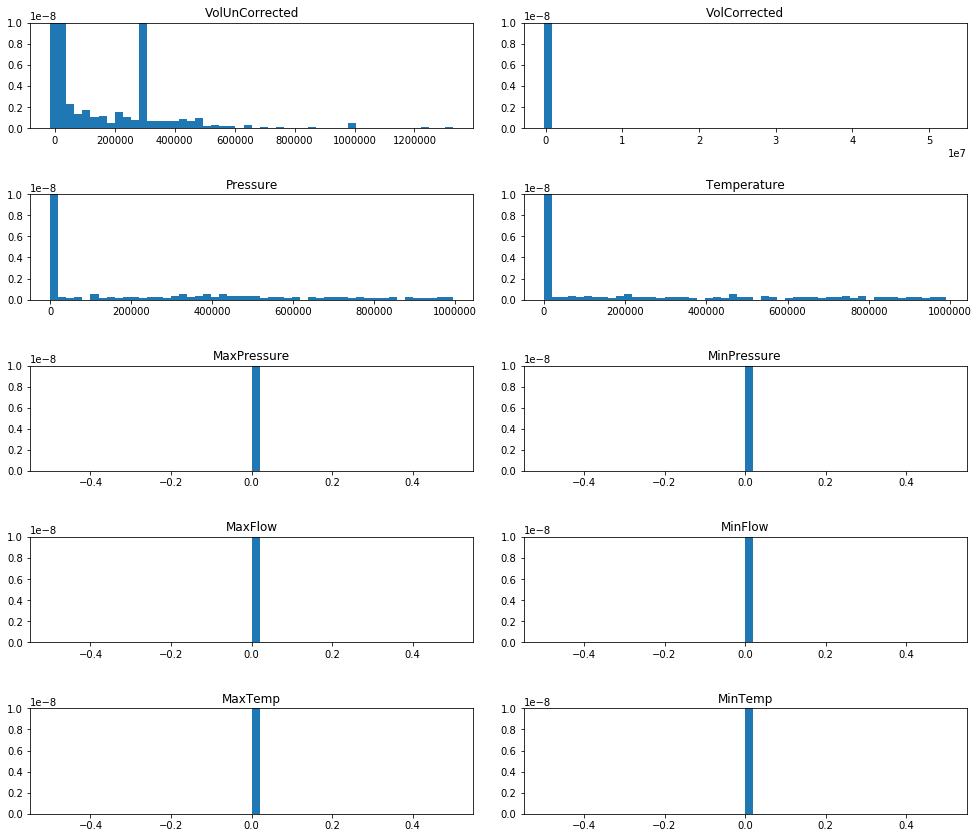

In [19]:
fig =plt.figure(figsize=(14,12))
cont = 0 
for i in numer.columns:
    cont+=1
    ax = plt.subplot(5,2,cont)
    plt.hist(numer[i], bins=50, density=True)
    ax.title.set_text(i)
    plt.ylim(0, 0.00000001)# modificar a 1 para ver la totalidad
fig.tight_layout(pad=2.0)

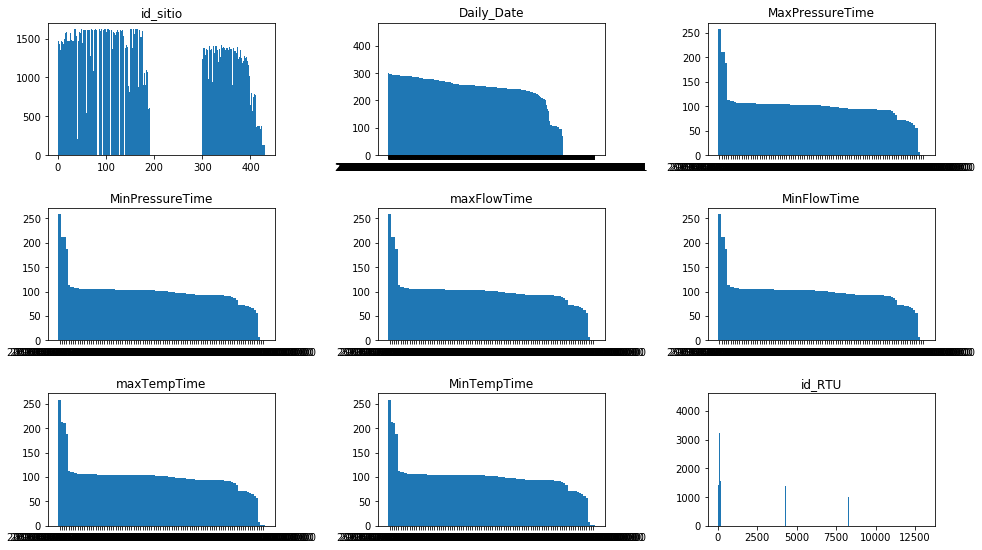

In [20]:
fig = plt.figure(figsize = (14,8))
for j,i in enumerate(objeto.columns):
#     print(j+1,i)
    ax = plt.subplot(3,3,j+1)
    plt.bar(x = objeto[i].value_counts().index,height=objeto[i].value_counts().values,   width=1.2)
    ax.title.set_text(i)
fig.tight_layout(pad=2.0)

<BarContainer object of 310 artists>

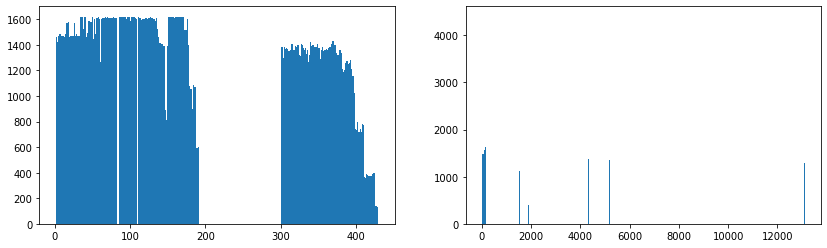

In [21]:
plt.figure(figsize = (14,4))
plt.subplot(1,2,1)
plt.bar(x = objeto['id_sitio'].value_counts().index,height=objeto['id_sitio'].value_counts().values,   width=2)

plt.subplot(1,2,2)
plt.bar(x = objeto['id_RTU'].value_counts().index,height=objeto['id_RTU'].value_counts().values,   width=1.2)

In [22]:
numer.corr()

,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MinPressure,MaxFlow,MinFlow,MaxTemp,MinTemp
VolUnCorrected,1.000000,0.032361,0.002088,0.001746,NaN,NaN,NaN,NaN,NaN,NaN
VolCorrected,0.032361,1.000000,-0.000632,-0.000868,NaN,NaN,NaN,NaN,NaN,NaN
Pressure,0.002088,-0.000632,1.000000,0.729668,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,0.001746,-0.000868,0.729668,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
MaxPressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinPressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MaxFlow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinFlow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MaxTemp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


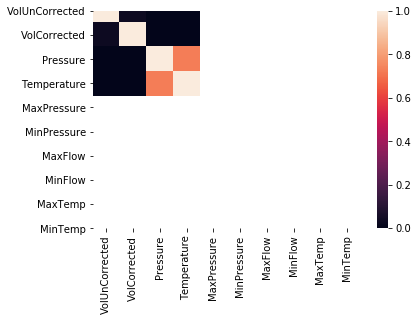

In [23]:

import seaborn as sns
sns.heatmap(numer.corr())

In [24]:
numer.corr(method ='spearman')

,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MinPressure,MaxFlow,MinFlow,MaxTemp,MinTemp
VolUnCorrected,1.000000,0.866719,-0.083246,0.016551,NaN,NaN,NaN,NaN,NaN,NaN
VolCorrected,0.866719,1.000000,0.320090,0.081383,NaN,NaN,NaN,NaN,NaN,NaN
Pressure,-0.083246,0.320090,1.000000,0.161894,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,0.016551,0.081383,0.161894,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
MaxPressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinPressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MaxFlow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinFlow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MaxTemp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


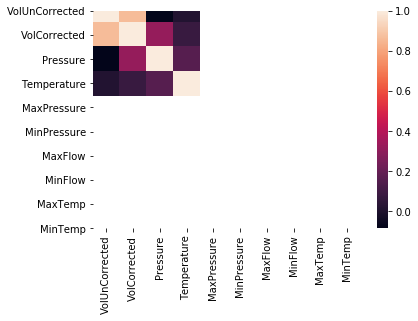

In [25]:
sns.heatmap(numer.corr(method ='spearman'))

In [26]:

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396887 entries, 0 to 396886
Data columns (total 20 columns):
id_sitio           396887 non-null object
corte_evento       396887 non-null bool
Daily_Date         396887 non-null object
VolUnCorrected     396835 non-null float64
VolCorrected       396818 non-null float64
Pressure           396503 non-null float64
Temperature        396503 non-null float64
MaxPressure        9114 non-null float64
MaxPressureTime    9114 non-null object
MinPressure        9114 non-null float64
MinPressureTime    9114 non-null object
MaxFlow            9114 non-null float64
maxFlowTime        9114 non-null object
MinFlow            9114 non-null float64
MinFlowTime        9114 non-null object
MaxTemp            9114 non-null float64
maxTempTime        9114 non-null object
MinTemp            9114 non-null float64
MinTempTime        9114 non-null object
id_RTU             396625 non-null object
dtypes: bool(1), float64(10), object(9)
memory usage: 57.9+ MB


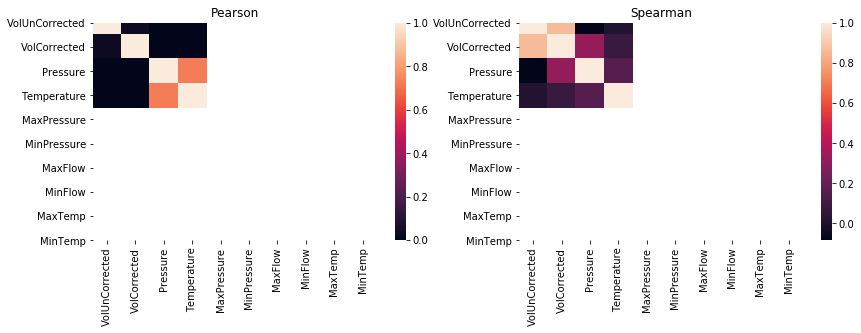

In [27]:
plt.figure(figsize = (14,4))
ax1 =plt.subplot(1,2,1)
sns.heatmap(numer.corr())
ax1.title.set_text('Pearson')
ax2 = plt.subplot(1,2,2)
sns.heatmap(numer.corr(method ='spearman'))
ax2.title.set_text('Spearman')

In [28]:
f = pd.to_datetime(data['Daily_Date'])

In [29]:
f.min()

Timestamp('2013-07-04 23:59:59')

In [30]:
f.max()

Timestamp('2018-01-22 23:59:59')

In [31]:
data.head(10)

,id_sitio,corte_evento,Daily_Date,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MaxPressureTime,MinPressure,MinPressureTime,MaxFlow,maxFlowTime,MinFlow,MinFlowTime,MaxTemp,maxTempTime,MinTemp,MinTempTime,id_RTU
0,34,False,2013-08-19 23:59:59,39.39,727.25,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,81
1,163,False,2013-08-21 23:59:59,1434.93,24170.80,NaN,NaN,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,3
2,40,False,2013-08-19 23:59:59,7709.26,69097.57,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,98
3,41,False,2013-08-19 23:59:59,404.14,7004.77,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,89
4,50,False,2013-08-19 23:59:59,3296.01,15331.19,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,87
5,56,False,2013-08-19 23:59:59,1086.54,31052.83,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,500
6,58,False,2013-08-19 23:59:59,1962.01,14520.87,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,110
7,59,False,2013-08-19 23:59:59,324.80,5569.88,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,115
8,60,False,2013-08-19 23:59:59,5720.22,29219.69,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,103
9,64,False,2013-08-19 23:59:59,0.00,0.00,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,108


In [42]:
p = (data[data['id_sitio']==34]).copy() 

In [43]:
p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])

In [45]:
p

,id_sitio,corte_evento,Daily_Date,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MaxPressureTime,MinPressure,MinPressureTime,MaxFlow,maxFlowTime,MinFlow,MinFlowTime,MaxTemp,maxTempTime,MinTemp,MinTempTime,id_RTU
0,34,False,2013-08-19 23:59:59,39.39,727.25,NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,81
57,34,False,2013-08-21 23:59:59,888.17,16971.21,NaN,NaN,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,81
147,34,False,2013-08-23 23:59:59,991.57,19051.99,249.00,10.00,0.0,2013-08-23 00:00:00,0.0,2013-08-23 00:00:00,0.0,2013-08-23 00:00:00,0.0,2013-08-23 00:00:00,0.0,2013-08-23 00:00:00,0.0,2013-08-23 00:00:00,81
152,34,False,2013-08-22 23:59:59,1094.22,20999.60,249.00,11.00,0.0,2013-08-22 00:00:00,0.0,2013-08-22 00:00:00,0.0,2013-08-22 00:00:00,0.0,2013-08-22 00:00:00,0.0,2013-08-22 00:00:00,0.0,2013-08-22 00:00:00,81
268,34,False,2013-08-24 23:59:59,650.88,12462.63,249.00,11.00,0.0,2013-08-24 00:00:00,0.0,2013-08-24 00:00:00,0.0,2013-08-24 00:00:00,0.0,2013-08-24 00:00:00,0.0,2013-08-24 00:00:00,0.0,2013-08-24 00:00:00,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395442,34,False,2018-01-18 23:59:59,1178.58,20059.83,219.61,10.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
395791,34,False,2018-01-19 23:59:59,1160.55,19712.37,219.85,10.63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
396072,34,False,2018-01-20 23:59:59,1079.36,18333.80,219.73,10.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
396337,34,False,2018-01-21 23:59:59,191.28,3181.29,220.06,16.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81


In [48]:
p['Day'] =p['Daily_Date'].dt.date

In [51]:
p.sort_values(by='Day', inplace=True)

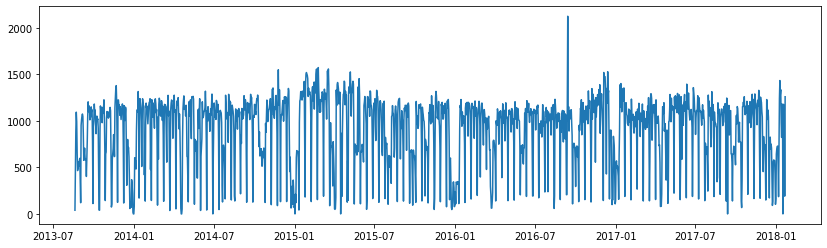

In [55]:
plt.figure(figsize = (14,4))
plt.plot(p['Day'],p['VolUnCorrected'])

(735233.0, 735265.0)

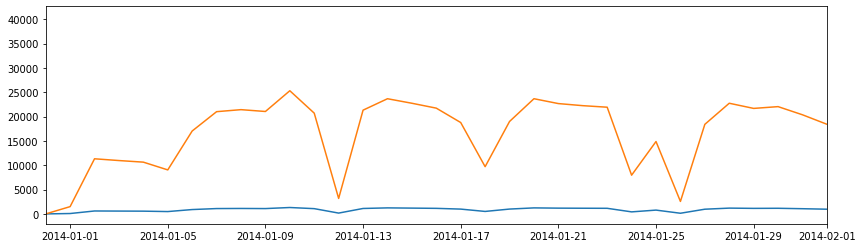

In [75]:
import datetime
fig = plt.figure(figsize = (14,4))
ax = plt.plot(p['Day'],p['VolUnCorrected'])
ax = plt.plot(p['Day'],p['VolCorrected'])
plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])


In [76]:
pd.set_option('display.max_rows', 25)

In [77]:
p[['VolCorrected','Day']]

,VolCorrected,Day
0,727.25,2013-08-19
57,16971.21,2013-08-21
152,20999.60,2013-08-22
147,19051.99,2013-08-23
268,12462.63,2013-08-24
...,...,...
395442,20059.83,2018-01-18
395791,19712.37,2018-01-19
396072,18333.80,2018-01-20
396337,3181.29,2018-01-21


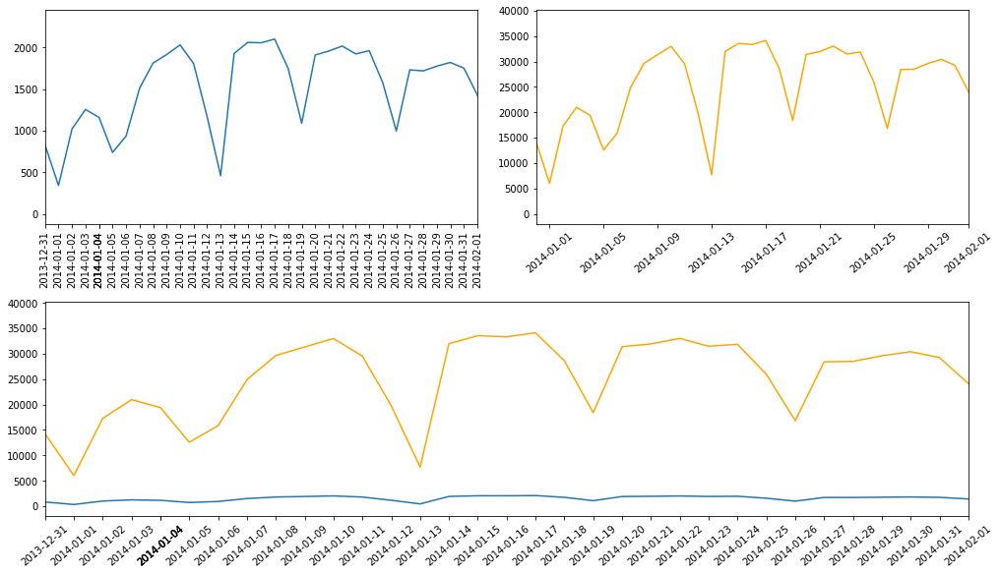

In [311]:
fig = plt.figure(figsize = (14,8),constrained_layout=True)
gs = fig.add_gridspec(nrows = 2,ncols =  2)

ax1 = plt.subplot(gs[0,0])
ax1.plot(p['Day'],p['VolUnCorrected'])

xlabels = p['Day']
ax1.set_xticks(xlabels)
ax1.set_xticklabels(xlabels, rotation=90)
ax1.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

plt.subplot(gs[0,1])
plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
plt.xticks(rotation=40)
plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

ax2 = plt.subplot(gs[1,0:])
ax2.plot(p['Day'],p['VolUnCorrected'])
ax2.plot(p['Day'],p['VolCorrected'], color ='orange')

xlabels = p['Day']
ax2.set_xticks(xlabels)
ax2.set_xticklabels(xlabels, rotation=40)
ax2.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])


# ax = plt.plot(p['Day'],p['VolUnCorrected'])
# ax = plt.plot(p['Day'],p['VolCorrected'])
# plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])
plt.show()

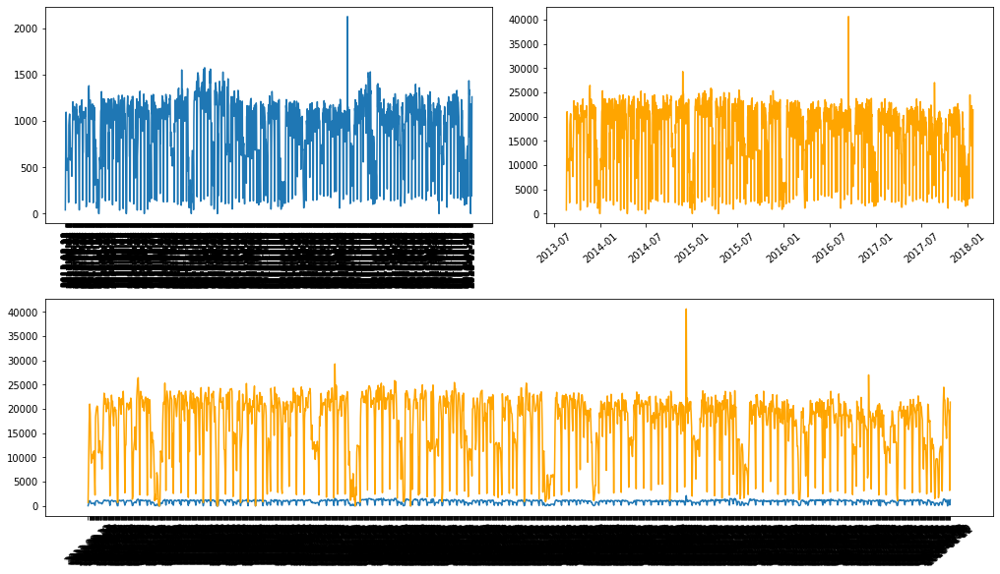

In [108]:
fig = plt.figure(figsize = (14,8),constrained_layout=True)
gs = fig.add_gridspec(nrows = 2,ncols =  2)

ax1 = plt.subplot(gs[0,0])
ax1.plot(p['Day'],p['VolUnCorrected'])

xlabels = p['Day']
ax1.set_xticks(xlabels)
ax1.set_xticklabels(xlabels, rotation=90)
# ax1.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

plt.subplot(gs[0,1])
plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
plt.xticks(rotation=40)
# plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

ax2 = plt.subplot(gs[1,0:])
ax2.plot(p['Day'],p['VolUnCorrected'])
ax2.plot(p['Day'],p['VolCorrected'], color ='orange')

xlabels = p['Day']
ax2.set_xticks(xlabels)
ax2.set_xticklabels(xlabels, rotation=40)
# ax2.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])


# ax = plt.plot(p['Day'],p['VolUnCorrected'])
# ax = plt.plot(p['Day'],p['VolCorrected'])
# plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])
plt.show()

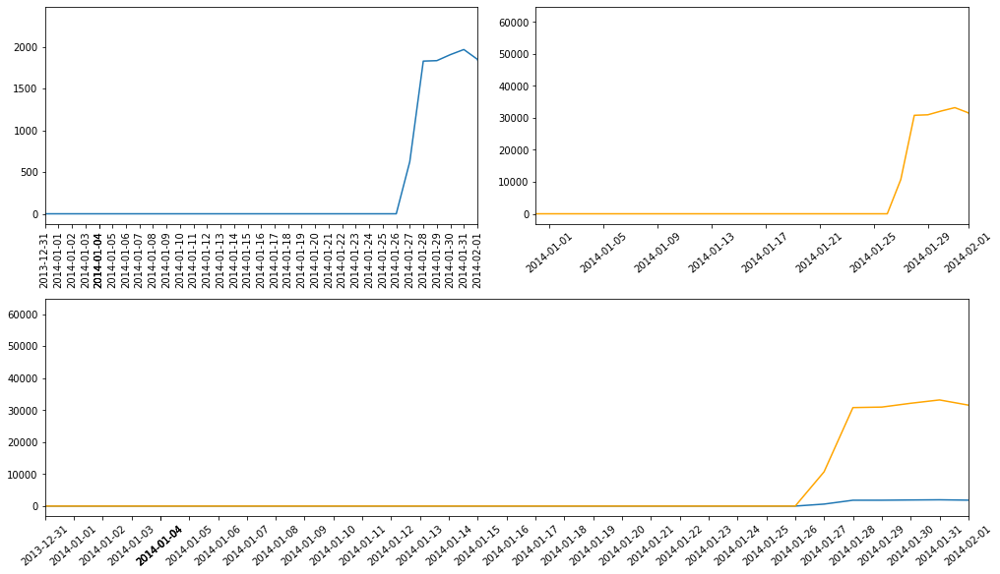

In [110]:
id_sitio =163
p = (data[data['id_sitio']==id_sitio]).copy() 
p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
p['Day'] =p['Daily_Date'].dt.date
p.sort_values(by='Day', inplace=True)


fig = plt.figure(figsize = (14,8),constrained_layout=True)
gs = fig.add_gridspec(nrows = 2,ncols =  2)

ax1 = plt.subplot(gs[0,0])
ax1.plot(p['Day'],p['VolUnCorrected'])

xlabels = p['Day']
ax1.set_xticks(xlabels)
ax1.set_xticklabels(xlabels, rotation=90)
ax1.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

plt.subplot(gs[0,1])
plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
plt.xticks(rotation=40)
plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])

ax2 = plt.subplot(gs[1,0:])
ax2.plot(p['Day'],p['VolUnCorrected'])
ax2.plot(p['Day'],p['VolCorrected'], color ='orange')

xlabels = p['Day']
ax2.set_xticks(xlabels)
ax2.set_xticklabels(xlabels, rotation=40)
ax2.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])


# ax = plt.plot(p['Day'],p['VolUnCorrected'])
# ax = plt.plot(p['Day'],p['VolCorrected'])
# plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])
plt.show()

In [113]:
conteo = data['id_sitio'].value_counts()
conteo[conteo>=1000]

166    1621
164    1620
156    1620
99     1620
92     1620
       ... 
181    1052
398    1024
397    1020
337    1015
312    1012
Name: id_sitio, Length: 255, dtype: int64

In [116]:
conteo.describe()

count     306.000000
mean     1297.016340
std       374.984375
min       128.000000
25%      1242.250000
50%      1395.500000
75%      1588.000000
max      1621.000000
Name: id_sitio, dtype: float64

In [117]:
conteo[conteo>=1588]

166    1621
164    1620
156    1620
99     1620
92     1620
       ... 
115    1599
106    1598
89     1594
162    1588
116    1588
Name: id_sitio, Length: 78, dtype: int64

In [125]:
def my_prim(id_sitio):
    p = (data[data['id_sitio']==id_sitio]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)


    fig = plt.figure(figsize = (14,8),constrained_layout=True)
    gs = fig.add_gridspec(nrows = 2,ncols =  2)

    ax1 = plt.subplot(gs[0,0])
    ax1.plot(p['Day'],p['VolUnCorrected'])

    xlabels = p['Day']
    ax1.set_xticks(xlabels)
    ax1.set_xticklabels(xlabels, rotation=90)
    ax1.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])

    plt.subplot(gs[0,1])
    plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
    plt.xticks(rotation=40)
    plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])

    ax2 = plt.subplot(gs[1,0:])
    ax2.plot(p['Day'],p['VolUnCorrected'])
    ax2.plot(p['Day'],p['VolCorrected'], color ='orange')

    xlabels = p['Day']
    ax2.set_xticks(xlabels)
    ax2.set_xticklabels(xlabels, rotation=40)
    ax2.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])

    fig.suptitle('Id_sitio : {}'.format(id_sitio))
    # ax = plt.plot(p['Day'],p['VolUnCorrected'])
    # ax = plt.plot(p['Day'],p['VolCorrected'])
    # plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 2, 1)])
    plt.show()

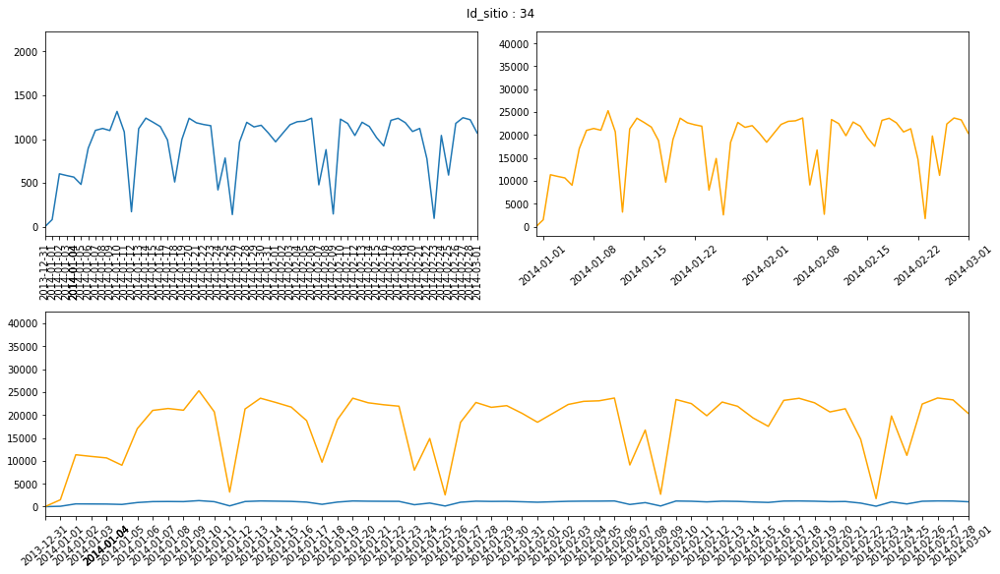

In [126]:
my_prim(34)

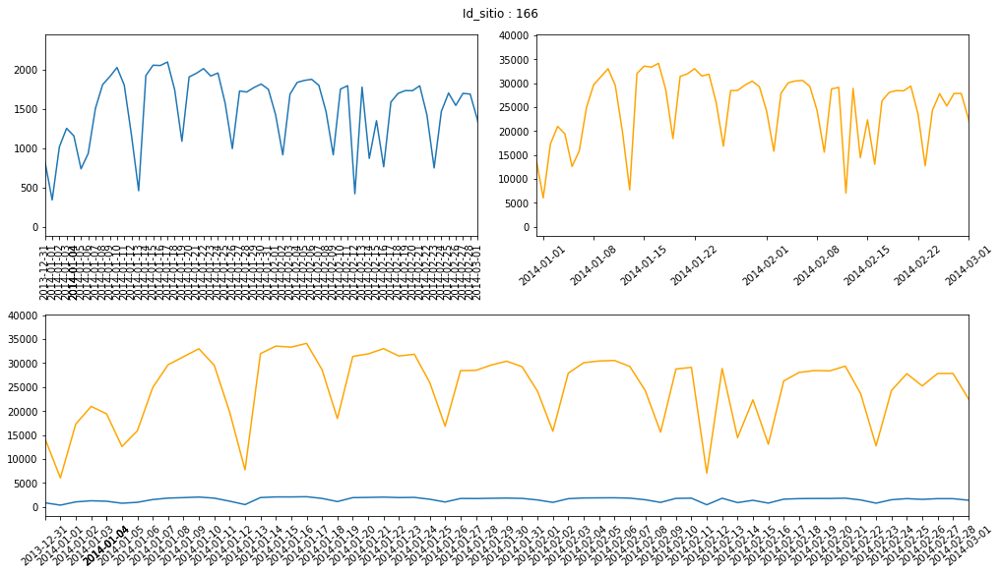

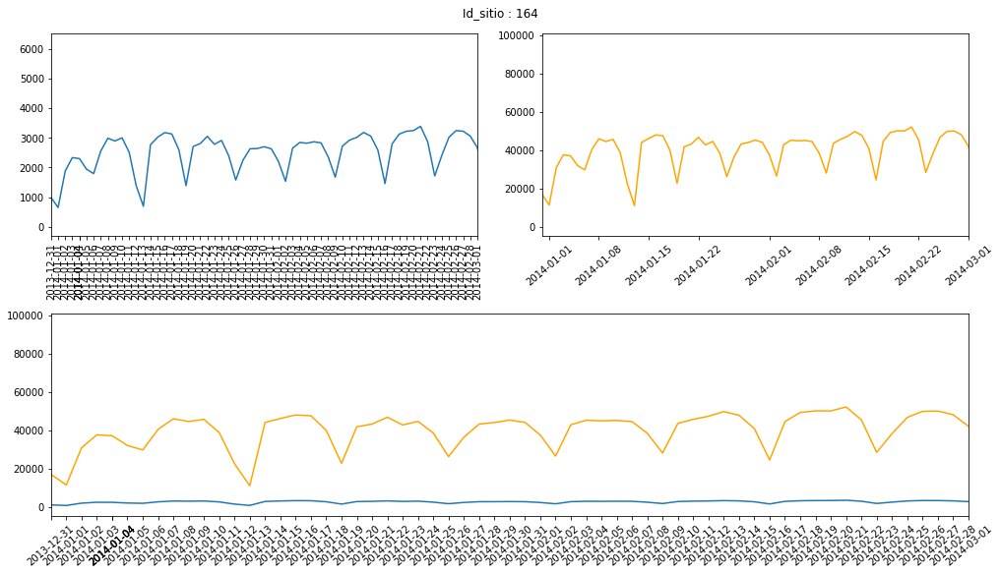

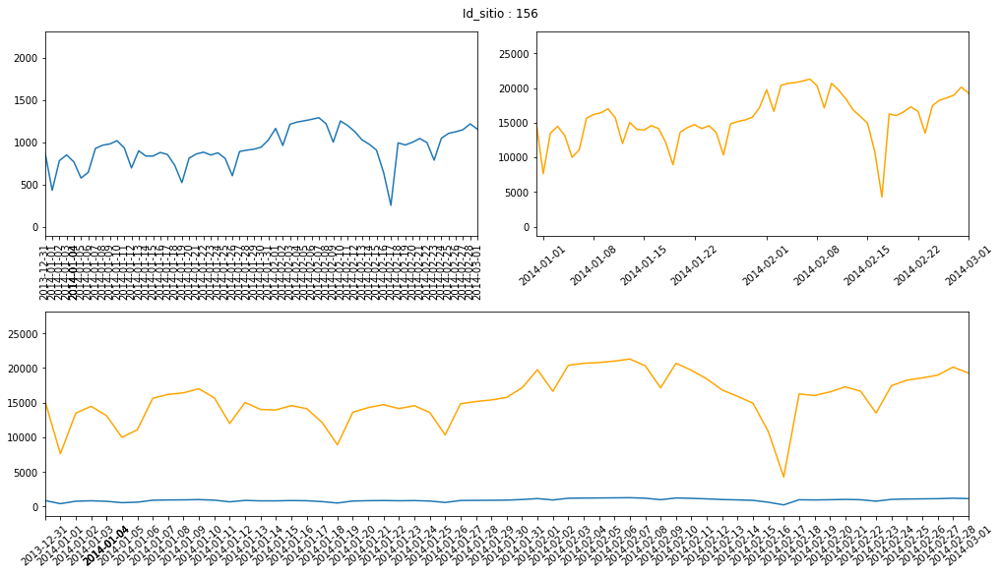

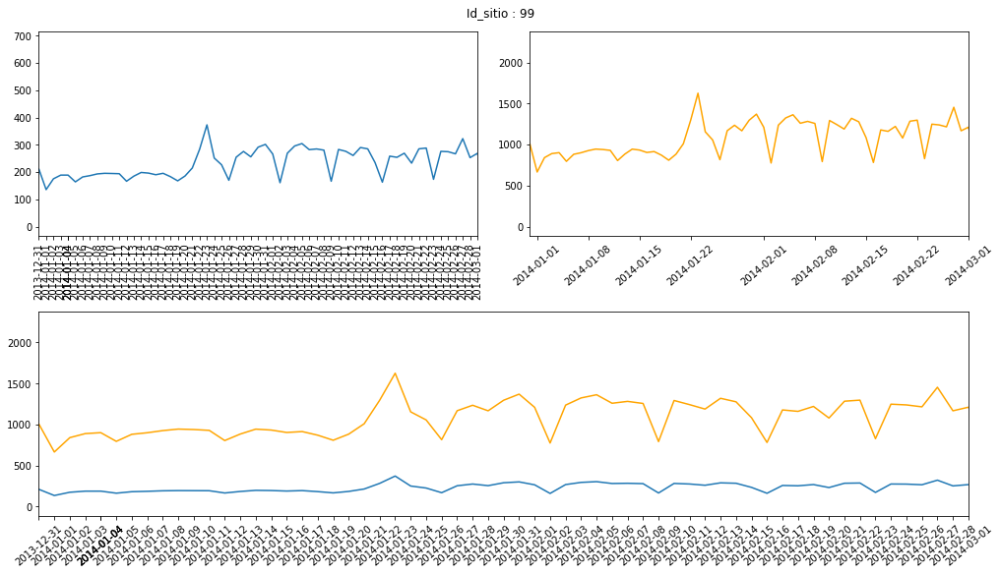

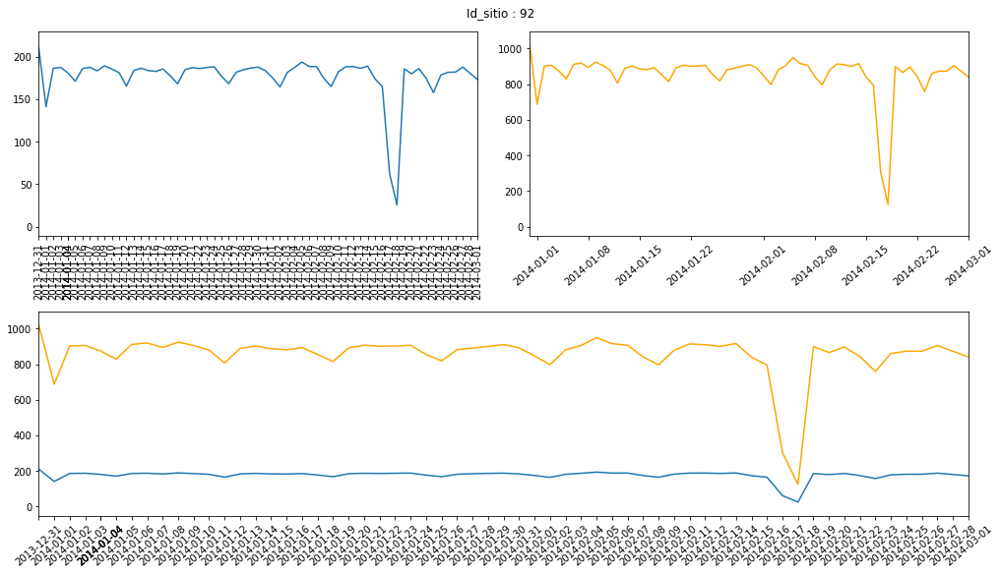

...

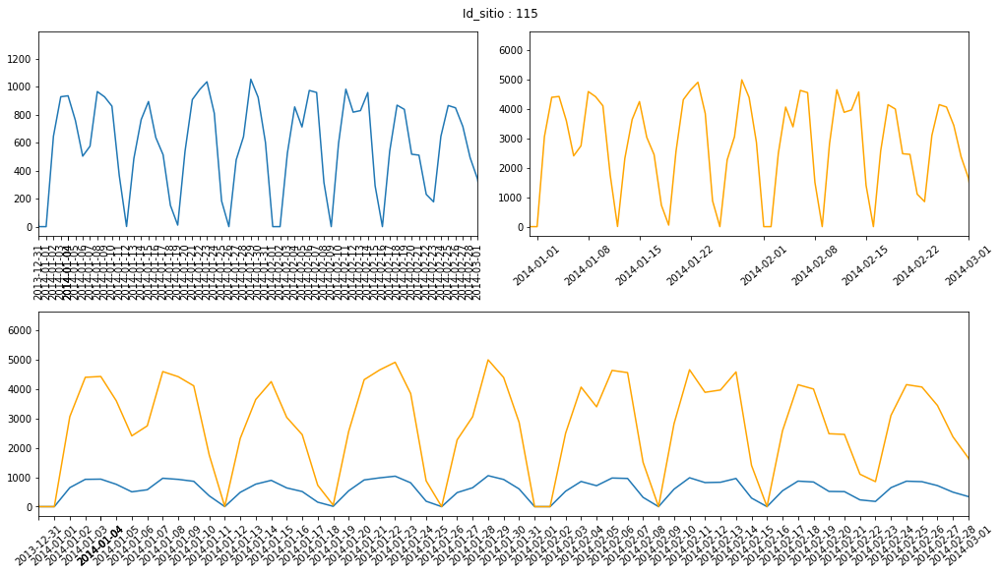

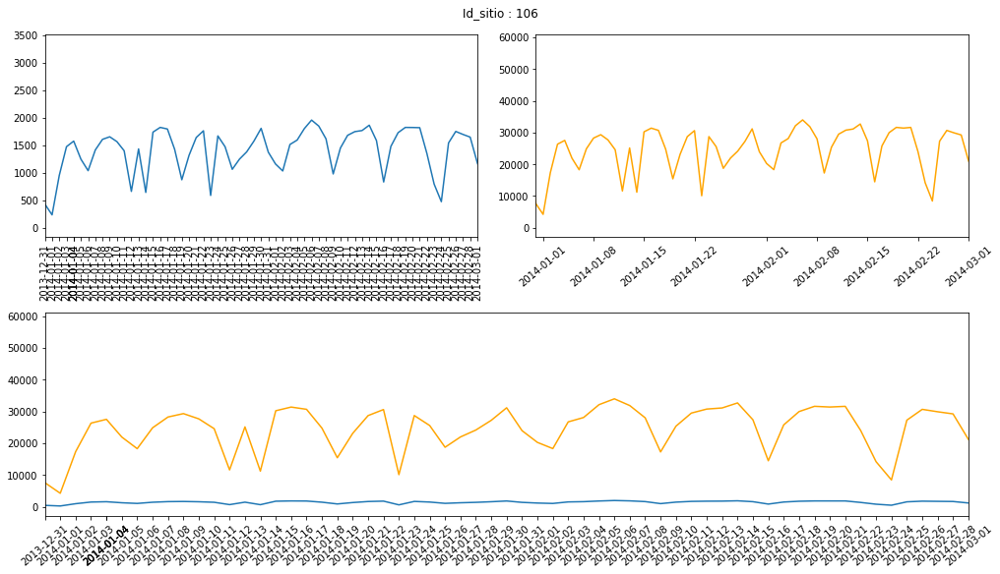

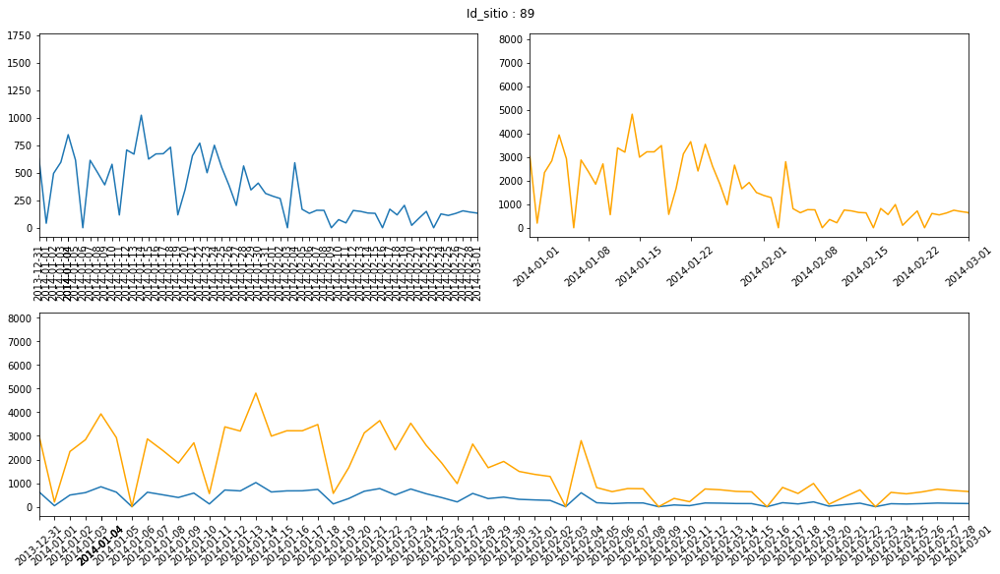

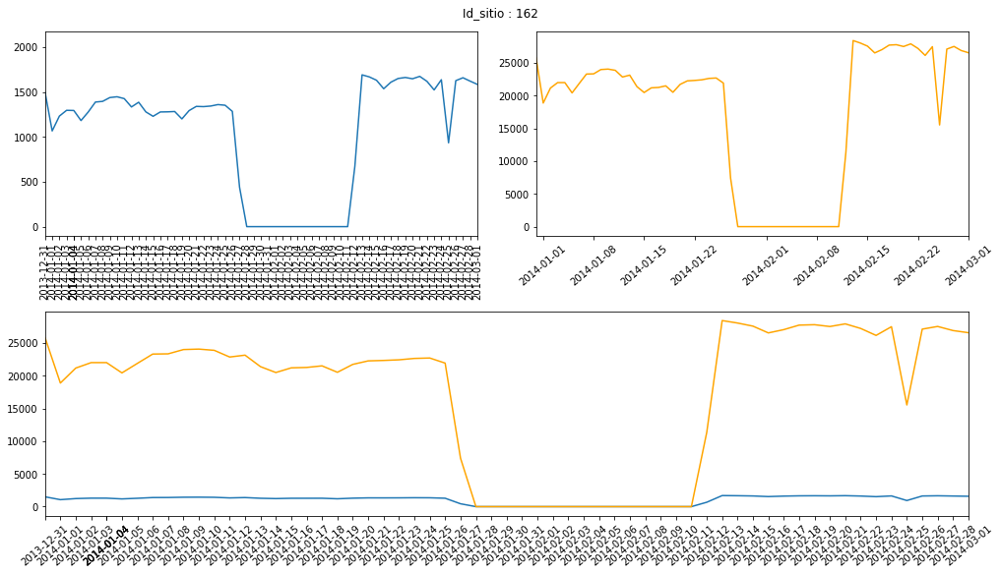

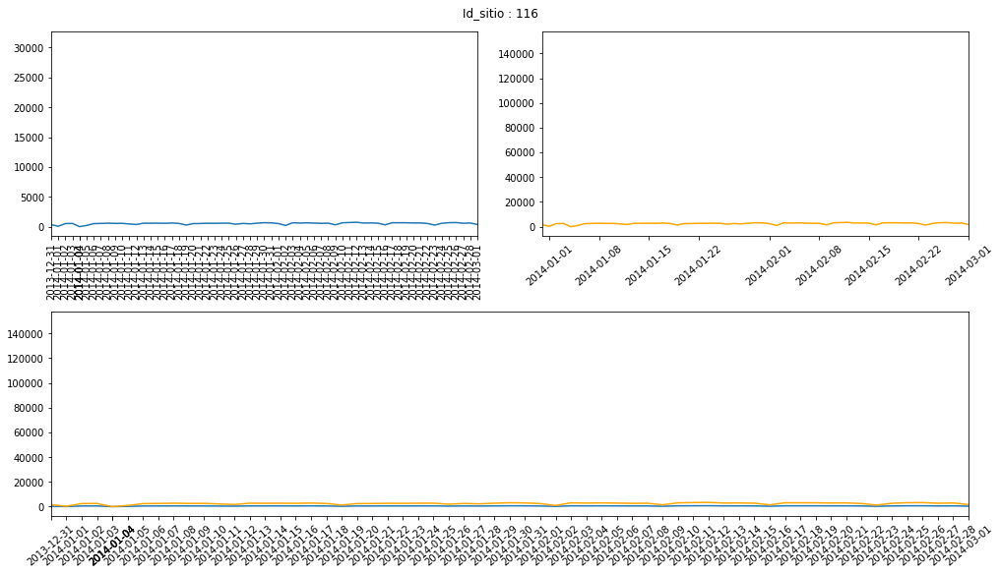

In [127]:
sal = conteo[conteo>=1588]
for i in sal.index:
    my_prim(i)

C:\Users\jibar\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


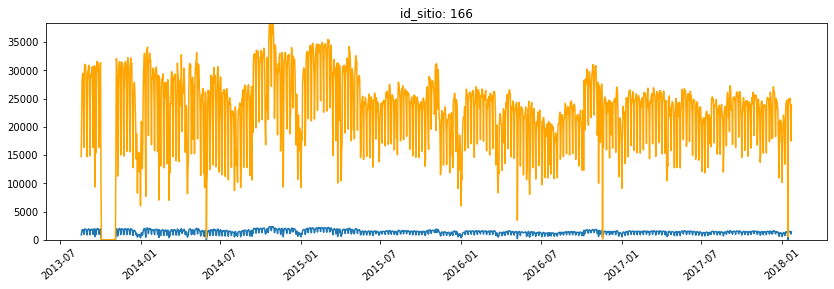

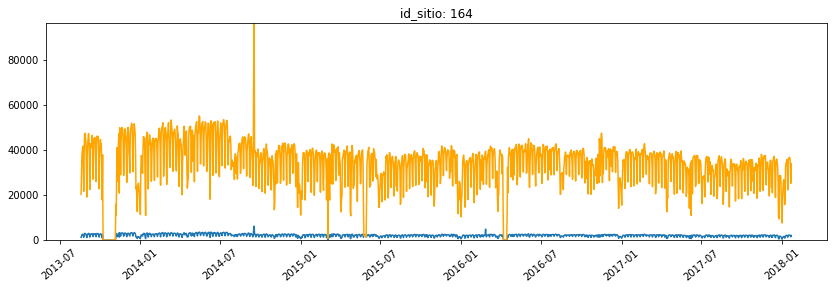

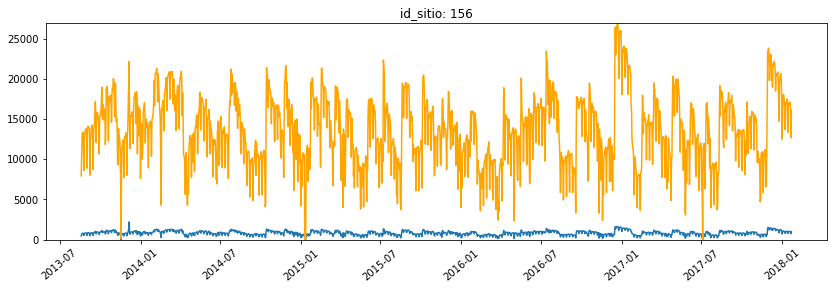

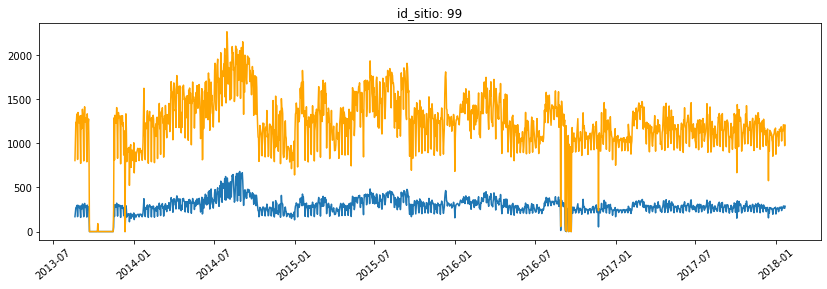

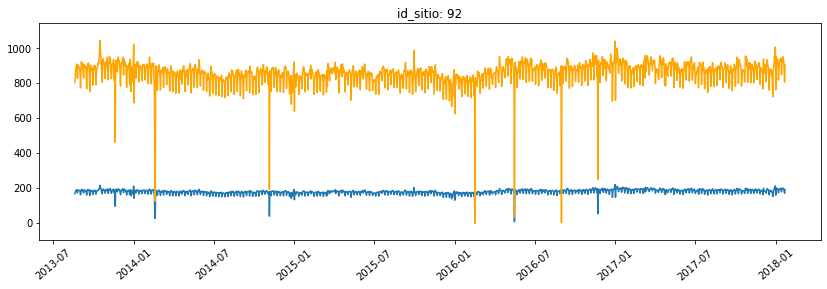

...

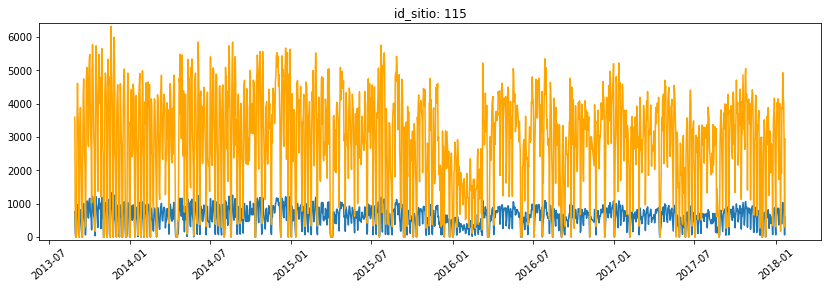

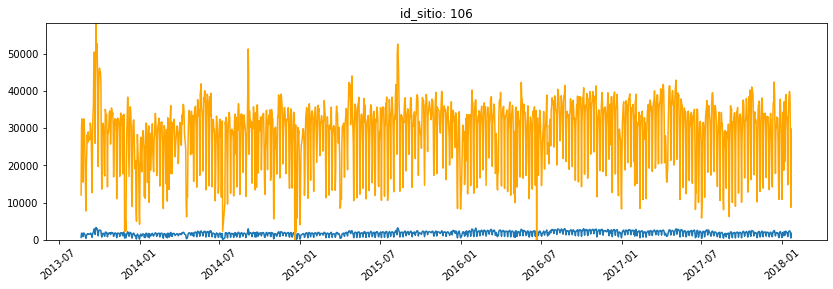

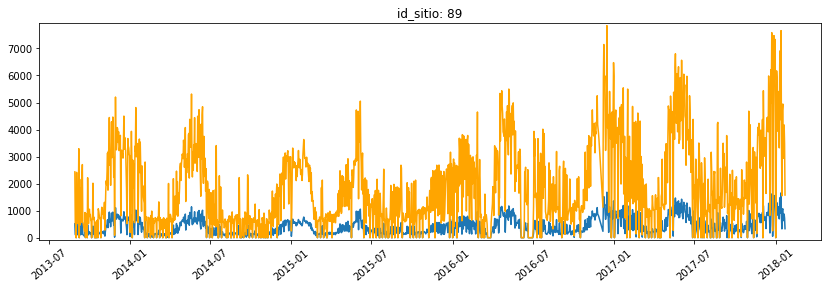

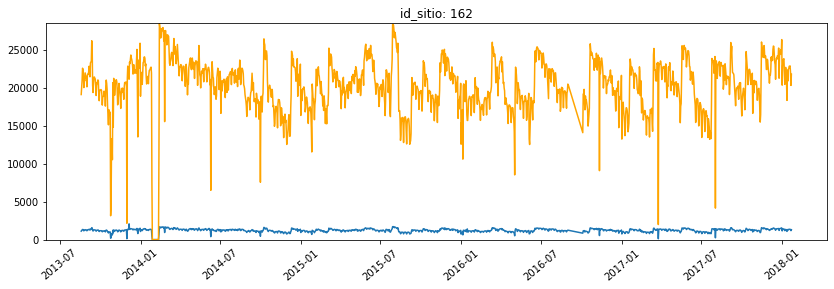

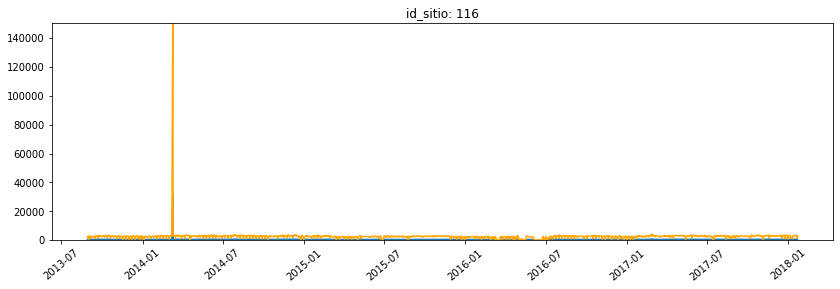

In [146]:
id_sitio = 34

sal = conteo[conteo>=1588]
for i in sal.index:
    p = (data[data['id_sitio']==i]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)

    plt.figure(figsize = (14,4))
    plt.plot(p['Day'],p['VolUnCorrected'] )
    plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
    plt.xticks(rotation=40)
    plt.ylim(p['VolCorrected'].min()-100,p['VolCorrected'].max()+100)
#     plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])
    plt.title('id_sitio: {}'.format(i))

In [136]:
conteo[conteo>=1621.000000]

166    1621
Name: id_sitio, dtype: int64

In [135]:
conteo.describe()

count     306.000000
mean     1297.016340
std       374.984375
min       128.000000
25%      1242.250000
50%      1395.500000
75%      1588.000000
max      1621.000000
Name: id_sitio, dtype: float64

In [137]:
conteo.value_counts()

1618    12
1620     9
1617     7
1611     6
1619     6
        ..
1350     1
1346     1
1345     1
1342     1
1024     1
Name: id_sitio, Length: 199, dtype: int64

In [140]:
conteo.value_counts()[conteo.value_counts()>5]

1618    12
1620     9
1617     7
1611     6
1619     6
Name: id_sitio, dtype: int64

In [145]:
p['VolCorrected'].max()

150379.95

In [ ]:
id_sitio = 34

sal = conteo[conteo>=1588]
for i in sal.index:
    p = (data[data['id_sitio']==i]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)

    plt.figure(figsize = (14,4))
    plt.plot(p['Day'],p['VolUnCorrected'] )
    plt.plot(p['Day'],p['VolCorrected'], color = 'orange')
    plt.xticks(rotation=40)
    plt.ylim(p['VolCorrected'].min()-100,p['VolCorrected'].max()+100)
#     plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])
    plt.title('id_sitio: {}'.format(i))

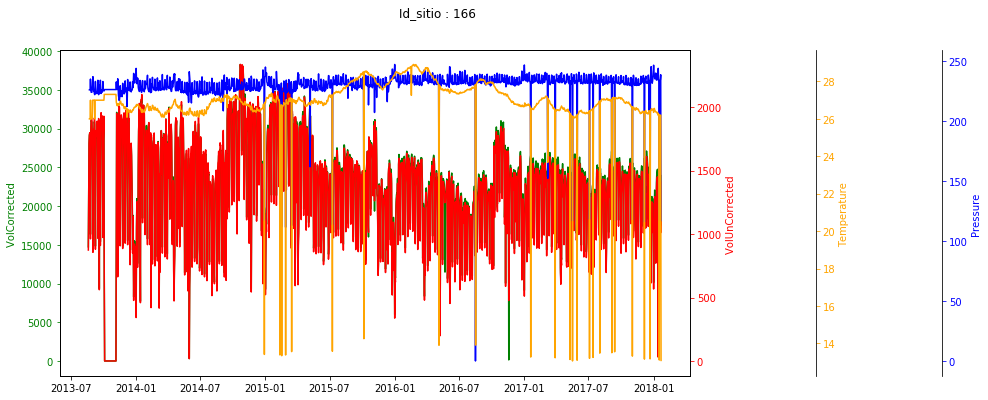

In [179]:
import matplotlib.pyplot as plt
import numpy as np
# To make things reproducible...
id_sitio =166
def todo_en(id_sitio):
    p = (data[data['id_sitio']==id_sitio]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)







    variable = ('VolCorrected','VolUnCorrected','Pressure','Temperature')

    fig, ax = plt.subplots(figsize = (14,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx(), ax.twinx(),ax.twinx() ]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.2))
    axes[-2].spines['right'].set_position(('axes', 1.4))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

    # And finally we get to plot things...
    colors = ('Green', 'Red', 'Blue','orange')

    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(p['Day'], p[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
    # axes[0].set_xlabel('X-axis')
    fig.suptitle('Id_sitio : {}'.format(id_sitio))
    plt.show()
id_sitio =166
todo_en(id_sitio)

<Figure size 1008x432 with 0 Axes>

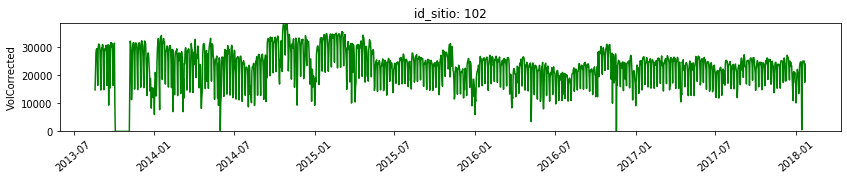

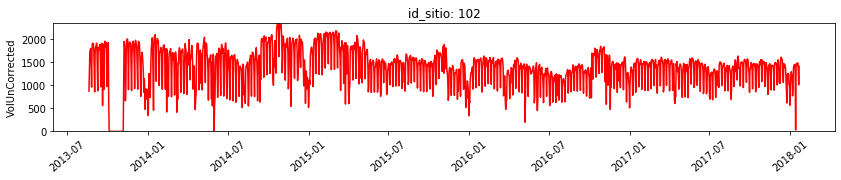

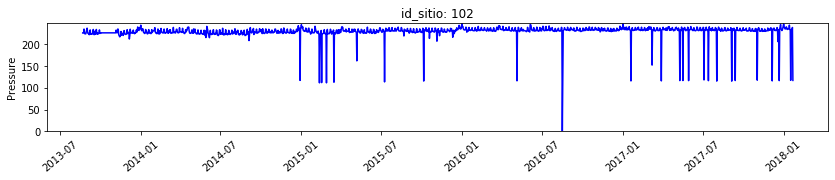

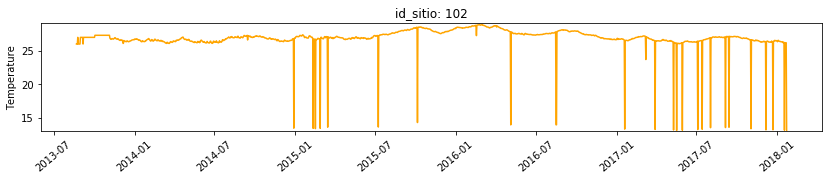

In [195]:
def separado_en(id_sitio):
    p = (data[data['id_sitio']==id_sitio]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)



    plt.figure(figsize=(14,6))
    colors = ('Green', 'Red', 'Blue','orange')
    variable = ('VolCorrected','VolUnCorrected','Pressure','Temperature')
    for color, variable in zip(colors, variable):
        plt.figure(figsize = (14,2))
        plt.plot(p['Day'],p[variable] , color = color)

        plt.xticks(rotation=40)
        plt.ylabel(variable)
        plt.ylim(p[variable].min()-p[variable].min()/100,p[variable].max()+p[variable].max()/100)
        #     plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])
        plt.title('id_sitio: {}'.format(i))
id_sitio=166
separado_en(id_sitio)

In [187]:
conteo = data['id_sitio'].value_counts()
conteo

166    1621
164    1620
156    1620
99     1620
92     1620
       ... 
42      202
426     138
427     136
429     130
425     128
Name: id_sitio, Length: 306, dtype: int64

In [188]:
conteo.describe()

count     306.000000
mean     1297.016340
std       374.984375
min       128.000000
25%      1242.250000
50%      1395.500000
75%      1588.000000
max      1621.000000
Name: id_sitio, dtype: float64

In [190]:
conteo.value_counts()

1618    12
1620     9
1617     7
1611     6
1619     6
        ..
1350     1
1346     1
1345     1
1342     1
1024     1
Name: id_sitio, Length: 199, dtype: int64

In [197]:
sal = conteo[conteo>=1611]
# for i in sal.index:
#     todo_en(i)
#     separado_en(i)

In [202]:
contrtu = data['id_RTU'].value_counts()
contrtu

163.0     4393
900.0     4368
133.0     3238
98.0      3236
90.0      3235
          ... 
5526.0       2
46.0         1
56.0         1
67.0         1
4001.0       1
Name: id_RTU, Length: 310, dtype: int64

In [207]:
contrtu[contrtu.index==166]

166.0    1543
Name: id_RTU, dtype: int64

In [204]:
contrtu.describe()

count     310.000000
mean     1279.435484
std       693.686158
min         1.000000
25%      1057.000000
50%      1381.000000
75%      1589.250000
max      4393.000000
Name: id_RTU, dtype: float64

In [ ]:
sal = conteortu[conteortu>=1611]

In [205]:
p.columns

Index(['id_sitio', 'corte_evento', 'Daily_Date', 'VolUnCorrected',
       'VolCorrected', 'Pressure', 'Temperature', 'MaxPressure',
       'MaxPressureTime', 'MinPressure', 'MinPressureTime', 'MaxFlow',
       'maxFlowTime', 'MinFlow', 'MinFlowTime', 'MaxTemp', 'maxTempTime',
       'MinTemp', 'MinTempTime', 'id_RTU', 'Day'],
      dtype='object')

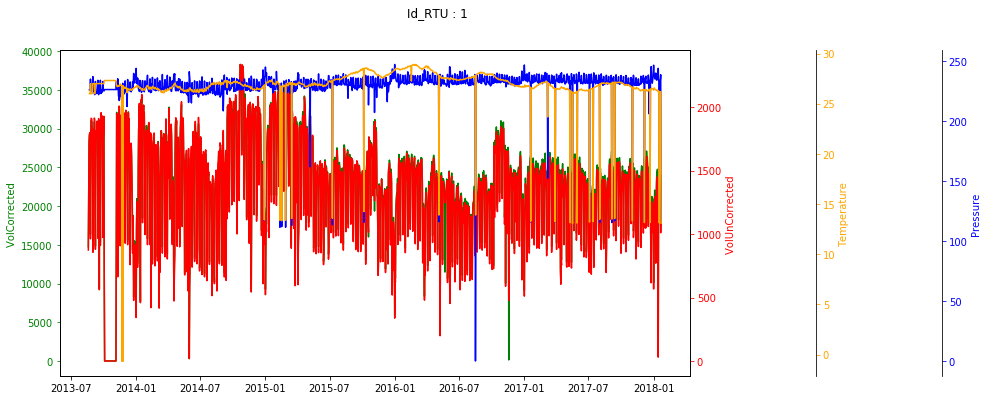

In [296]:
id_rtu =166
def todo_en(id_RTU):
    p = (data[data['id_RTU']==id_RTU]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)







    variable = ('VolCorrected','VolUnCorrected','Pressure','Temperature')

    fig, ax = plt.subplots(figsize = (14,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx(), ax.twinx(),ax.twinx() ]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.2))
    axes[-2].spines['right'].set_position(('axes', 1.4))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

    # And finally we get to plot things...
    colors = ('Green', 'Red', 'Blue','orange')

    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(p['Day'], p[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
    # axes[0].set_xlabel('X-axis')
    fig.suptitle('Id_RTU : {}'.format(id_RTU))
    plt.show()
id_RTU =1
todo_en(id_RTU)

<Figure size 1008x432 with 0 Axes>

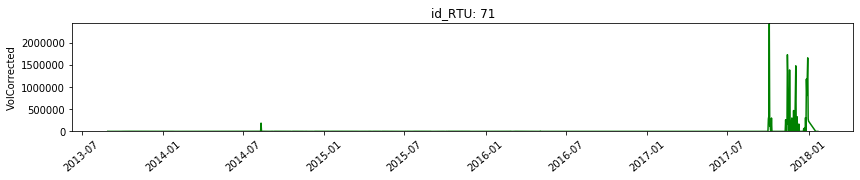

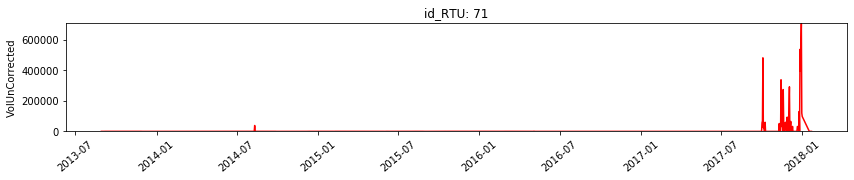

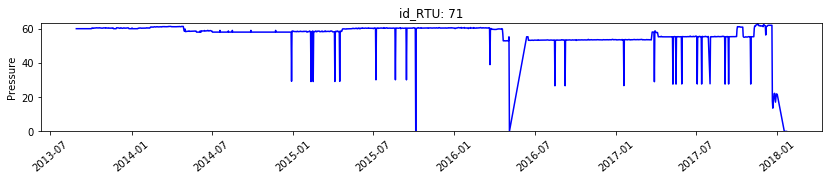

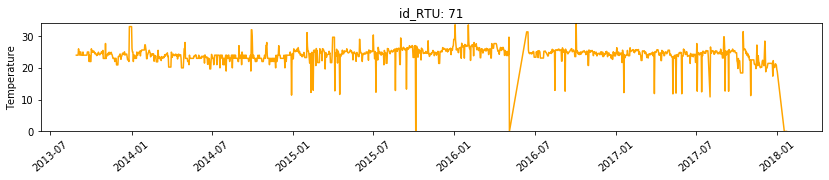

In [243]:
def separado_en(id_RTU):
    p = (data[data['id_RTU']==id_RTU]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)



    plt.figure(figsize=(14,6))
    colors = ('Green', 'Red', 'Blue','orange')
    variable = ('VolCorrected','VolUnCorrected','Pressure','Temperature')
    for color, variable in zip(colors, variable):
        plt.figure(figsize = (14,2))
        plt.plot(p['Day'],p[variable] , color = color)

        plt.xticks(rotation=40)
        plt.ylabel(variable)
        plt.ylim(p[variable].min()-p[variable].min()/100,p[variable].max()+p[variable].max()/100)
        #     plt.xlim([datetime.date(2013, 12, 31), datetime.date(2014, 3, 1)])
        plt.title('id_RTU: {}'.format(i))
id_RTU=166
separado_en(id_RTU)

208.51
26.09


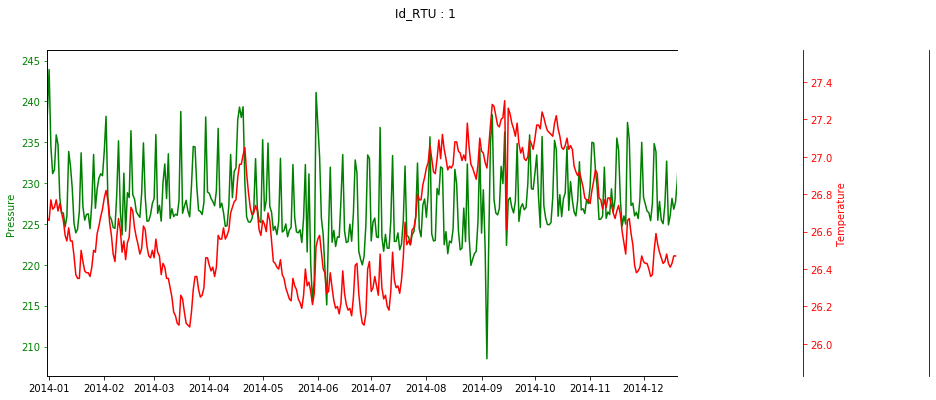

In [285]:
id_rtu =166
def todo_en(id_RTU):
    p = (data[data['id_RTU']==id_RTU]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)

    p.set_index('Daily_Date', inplace=True)





    variable = ('Pressure','Temperature')

    fig, ax = plt.subplots(figsize = (14,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx() ]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.2))
    axes[-2].spines['right'].set_position(('axes', 1.4))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

    # And finally we get to plot things...
    colors = ('Green', 'Red')

    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(p['Day'], p[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
        ax.set_xlim([datetime.date(2013, 12, 31), datetime.date(2014, 12, 20)])
        p = p[datetime.date(2013, 12, 31): datetime.date(2014, 12, 20)]
        
        ax.set_ylim(p[variable].min()-p[variable].min()/100,p[variable].max()+p[variable].max()/100)
        print(p[variable].min())
        #ax.set_ylim(10,15)
        
        
    # axes[0].set_xlabel('X-axis')
    fig.suptitle('Id_RTU : {}'.format(id_RTU))
#     ax.set_ylim(100,250)
    
    plt.show()
id_RTU =1
todo_en(id_RTU)

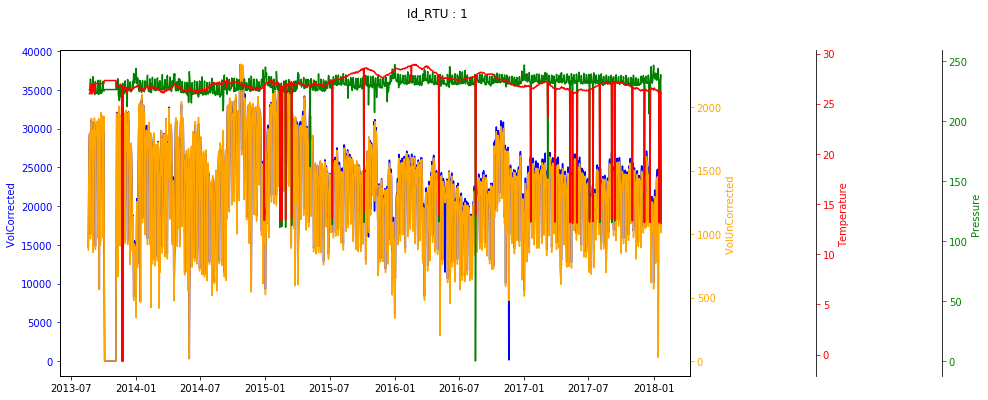

In [300]:
id_rtu =166
def todo_en(id_RTU):
    p = (data[data['id_RTU']==id_RTU]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)







    variable = ('VolCorrected','VolUnCorrected','Pressure','Temperature')
    fig, ax = plt.subplots(figsize = (14,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx(), ax.twinx(),ax.twinx() ]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.2))
    axes[-2].spines['right'].set_position(('axes', 1.4))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

    # And finally we get to plot things...
    colors = ('Blue','Orange','Green', 'Red')
    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(p['Day'], p[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
#         ax.set_xlim([datetime.date(2013, 12, 31), datetime.date(2015, 1, 20)])
#         p = p[datetime.date(2013, 12, 31): datetime.date(2015, 1, 20)]# funciona solo si el index es las fechas datetime
        
    # axes[0].set_xlabel('X-axis')
    fig.suptitle('Id_RTU : {}'.format(id_RTU))
    plt.show()
id_RTU =1
todo_en(id_RTU)

In [305]:


p = (data[data['id_RTU']==id_RTU]).copy() 
p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
p['Day'] =p['Daily_Date'].dt.date
p.sort_values(by='Day', inplace=True)

sal = p['VolCorrected']/p['VolUnCorrected']

(array([735050., 735234., 735415., 735599., 735780., 735964., 736146.,
        736330., 736511., 736695.]), <a list of 10 Text xticklabel objects>)

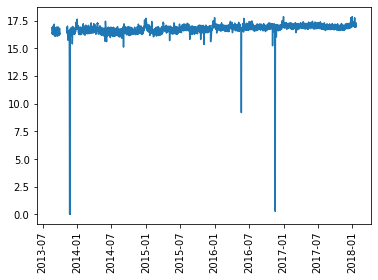

In [309]:
plt.plot(p['Day'],sal)
plt.xticks(rotation=90)

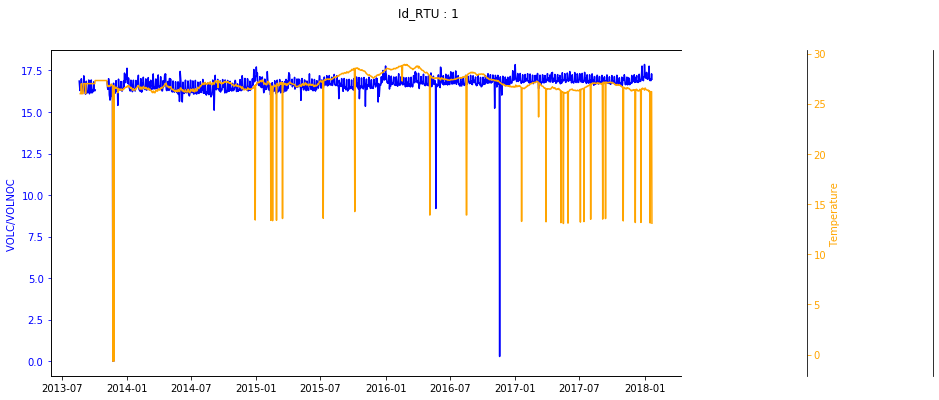

In [312]:
def todo_en(id_RTU):
    p = (data[data['id_RTU']==id_RTU]).copy() 
    p['Daily_Date']   = pd.to_datetime(p['Daily_Date'])
    p['Day'] =p['Daily_Date'].dt.date
    p.sort_values(by='Day', inplace=True)

    sal = p['VolCorrected']/p['VolUnCorrected']

    p['VOLC/VOLNOC']=sal



    variable = ('VOLC/VOLNOC','Temperature')
    fig, ax = plt.subplots(figsize = (14,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx()]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.2))
    axes[-2].spines['right'].set_position(('axes', 1.4))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

    # And finally we get to plot things...
    colors = ('Blue','Orange')
    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(p['Day'], p[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
#         ax.set_xlim([datetime.date(2013, 12, 31), datetime.date(2015, 1, 20)])
#         p = p[datetime.date(2013, 12, 31): datetime.date(2015, 1, 20)]# funciona solo si el index es las fechas datetime
        
    # axes[0].set_xlabel('X-axis')
    fig.suptitle('Id_RTU : {}'.format(id_RTU))
    plt.show()
id_RTU =1
todo_en(id_RTU)